# Clustering

### Different Clustering Algorithms

In [291]:
import numpy as np

%matplotlib inline
import matplotlib.pyplot as plt

True number of clusters is 15


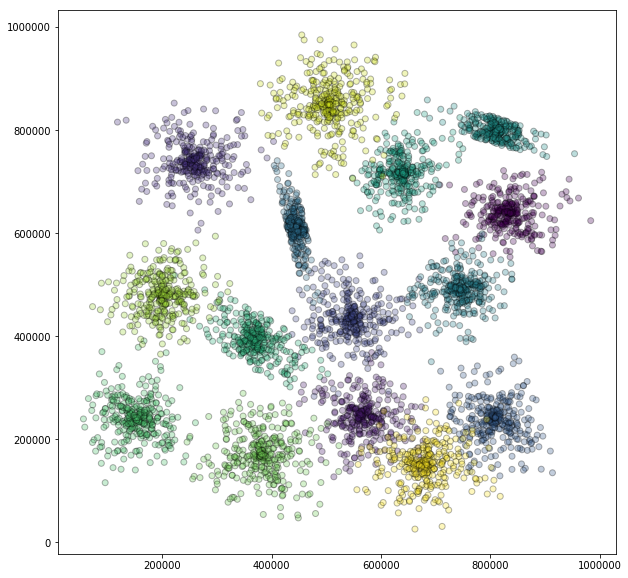

In [292]:
points, labels = np.loadtxt('data/clustering.txt'), np.loadtxt('data/clustering_labels.txt')
labels = labels.astype(int)
print("True number of clusters is {}".format(np.max(labels)))
plt.figure(figsize=(10, 10))
plt.scatter(points[:,0], points[:,1], c=labels, alpha=0.3, edgecolor='k')
plt.show()

In [294]:
#import bib
from sklearn.cluster import KMeans, AgglomerativeClustering, Birch 
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, adjusted_mutual_info_score
from sklearn.cluster import SpectralClustering, DBSCAN, AffinityPropagation,FeatureAgglomeration

import sys
import warnings

if not sys.warnoptions:
    warnings.simplefilter("ignore")

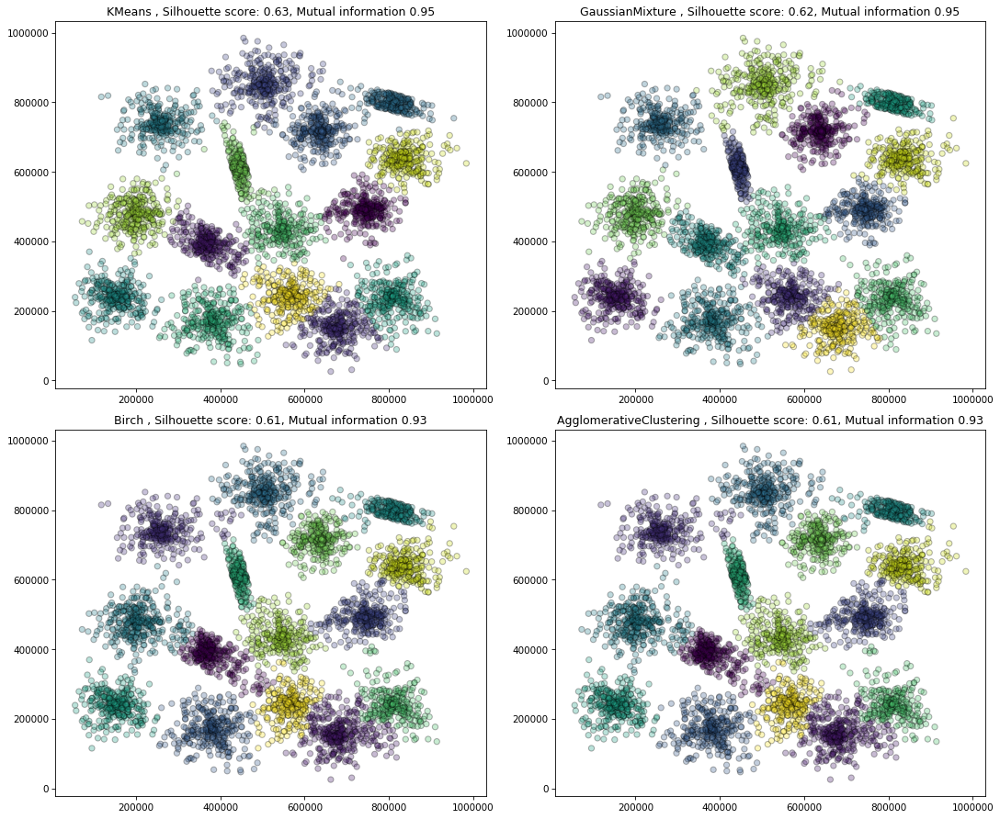

In [295]:
true_number_of_clusters = int(np.max(labels.astype(int)))
random_state = 0


clst1 = KMeans(n_clusters = true_number_of_clusters, random_state = random_state)
clst2 = GaussianMixture(n_components = true_number_of_clusters, random_state = random_state)
clst3 = Birch(n_clusters = true_number_of_clusters)
clst4 = AgglomerativeClustering(n_clusters = true_number_of_clusters)

names = ['KMeans', 
        'GaussianMixture', 
        'Birch',
        'AgglomerativeClustering']

clsts = [clst1, clst2, clst3, clst4]
                                

fig, axes = plt.subplots(
    ncols=2,
    nrows=2, figsize=(6 * ((len(clsts) + 1)) // 2, 12),
    dpi=75
)

for clst, ax, name in zip(clsts, axes.flat, names):
    model = clst.fit_predict(points)
    ax = plt.subplot(ax)
    plt.scatter(points[:,0], points[:,1], c = model, alpha=0.3, edgecolor='k')
    plt.title(" %s , Silhouette score: %0.2f, Mutual information %0.2f " 
              % (name, silhouette_score(points, model), adjusted_mutual_info_score(labels, model)))    
plt.tight_layout()
plt.show()

In [5]:
names = ['KMeans', 
        'GaussianMixture', 
        'Birch',
        'AgglomerativeClustering']

number_of_clusters = np.arange(10, 21, dtype = int)

s_km = []
m_km = []
s_gm = []
m_gm = []
s_b = []
m_b = []
s_ac = []
m_ac = []

for number in number_of_clusters:
    clst1 = KMeans(n_clusters = number, random_state = random_state)
    model = clst1.fit_predict(points)
    s_km.append(silhouette_score(points, model))
    m_km.append(adjusted_mutual_info_score(labels, model))

    clst2 = GaussianMixture(n_components =  number, random_state = random_state)
    model = clst2.fit_predict(points)
    s_gm.append(silhouette_score(points, model))
    m_gm.append(adjusted_mutual_info_score(labels, model))
    
    clst3 = Birch(n_clusters = int(number))
    model = clst3.fit_predict(points)
    s_b.append(silhouette_score(points, model))
    m_b.append(adjusted_mutual_info_score(labels, model))
    
    clst4 = AgglomerativeClustering(n_clusters = number)
    model = clst4.fit_predict(points)
    s_ac.append(silhouette_score(points, model))
    m_ac.append(adjusted_mutual_info_score(labels, model))
    

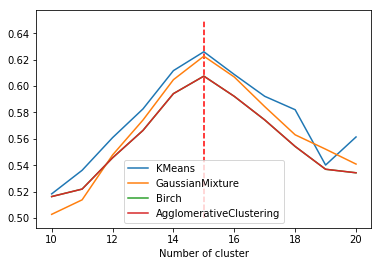

In [6]:
plt.plot([15]*len(np.arange(0.5, 0.7, 0.05)), np.arange(0.5, 0.7,0.05), linestyle = '--', color = 'red')
plt.plot(np.arange(10, 21), s_km, label = 'KMeans')
plt.plot(np.arange(10, 21), s_gm, label ='GaussianMixture')
plt.plot(np.arange(10, 21), s_b, label = 'Birch')
plt.plot(np.arange(10, 21), s_ac, label = 'AgglomerativeClustering')
plt.xlabel('Number of cluster')

plt.legend()
plt.show()

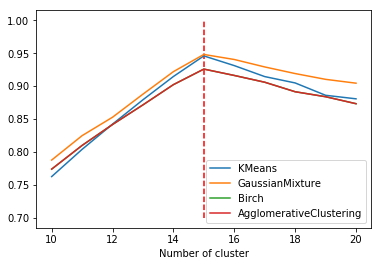

In [7]:
plt.plot([15]*len(np.arange(0.7, 1, 0.05)), np.arange(0.7, 1,0.05), linestyle = '--', color = 'red')

plt.plot(np.arange(10, 21), m_km, label = 'KMeans')
plt.plot(np.arange(10, 21), m_gm, label ='GaussianMixture')
plt.plot(np.arange(10, 21), m_b, label = 'Birch')
plt.plot(np.arange(10, 21), m_ac, label = 'AgglomerativeClustering')
plt.xlabel('Number of cluster')

plt.legend()
plt.show()


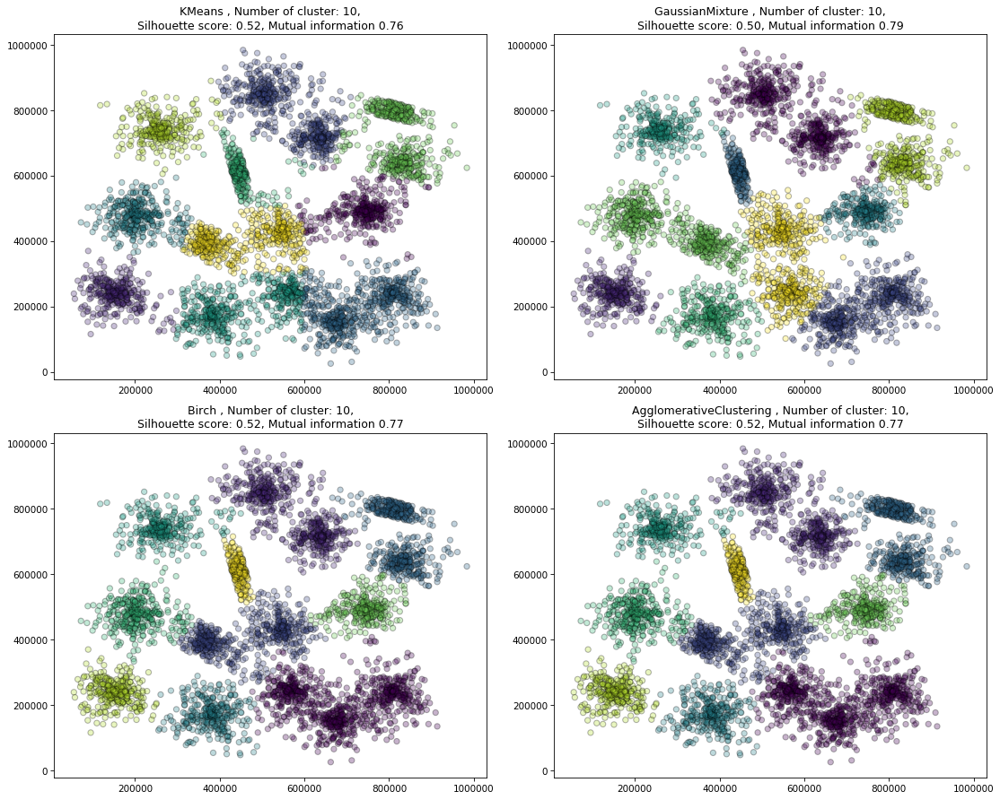

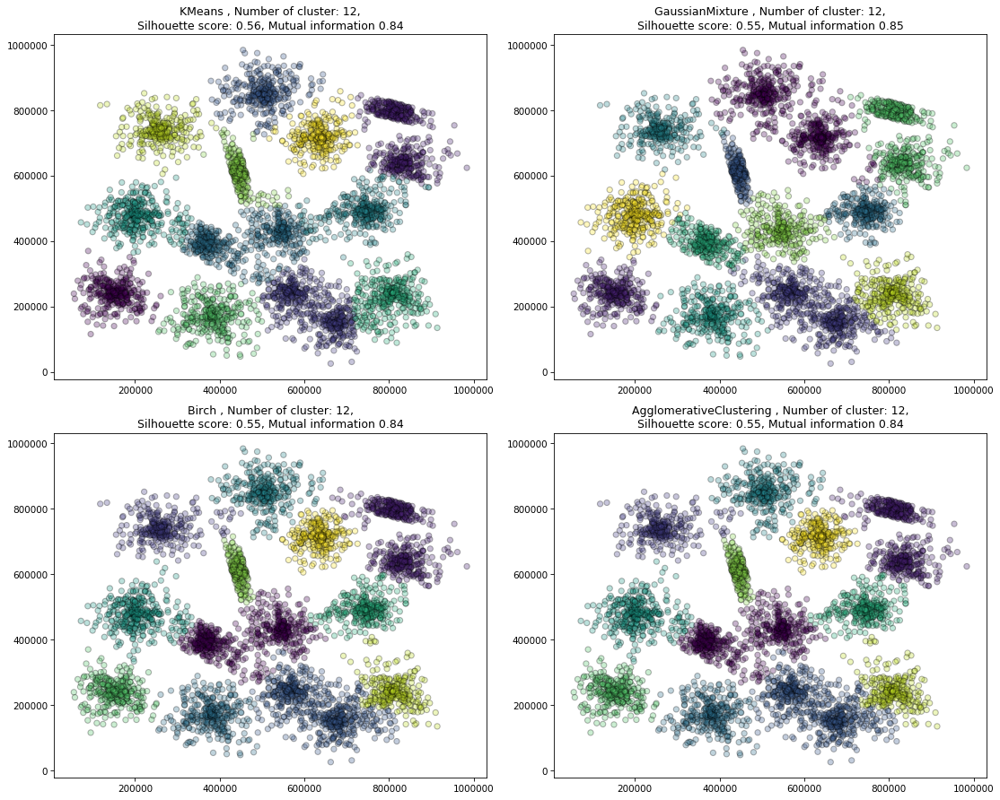

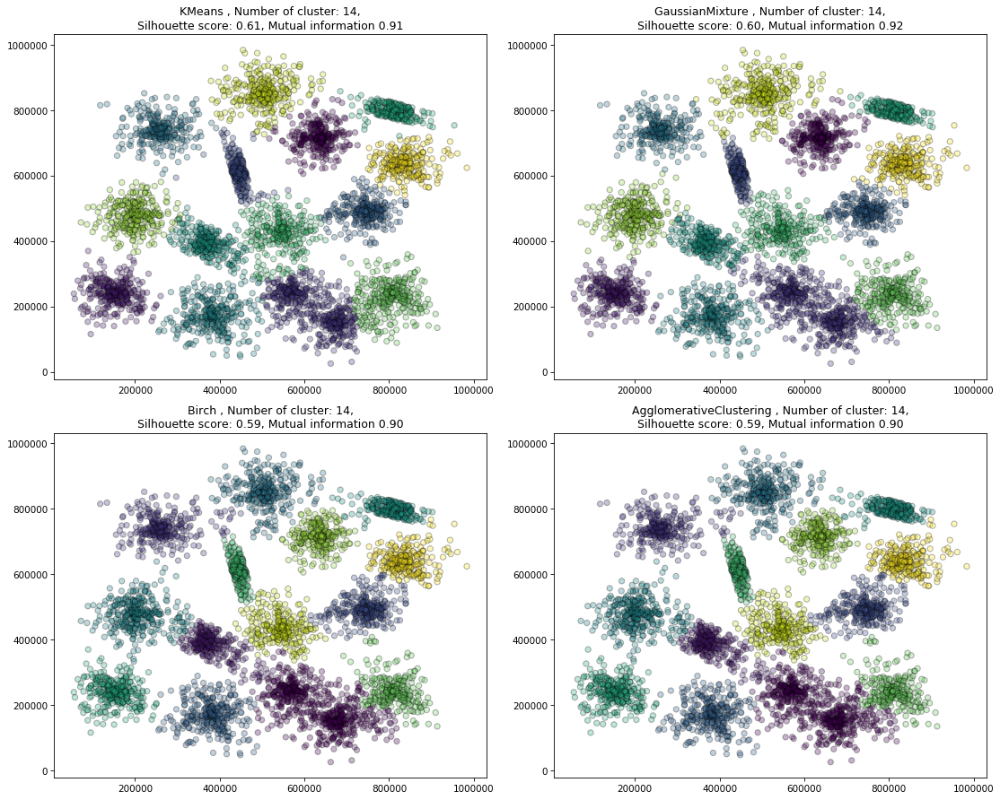

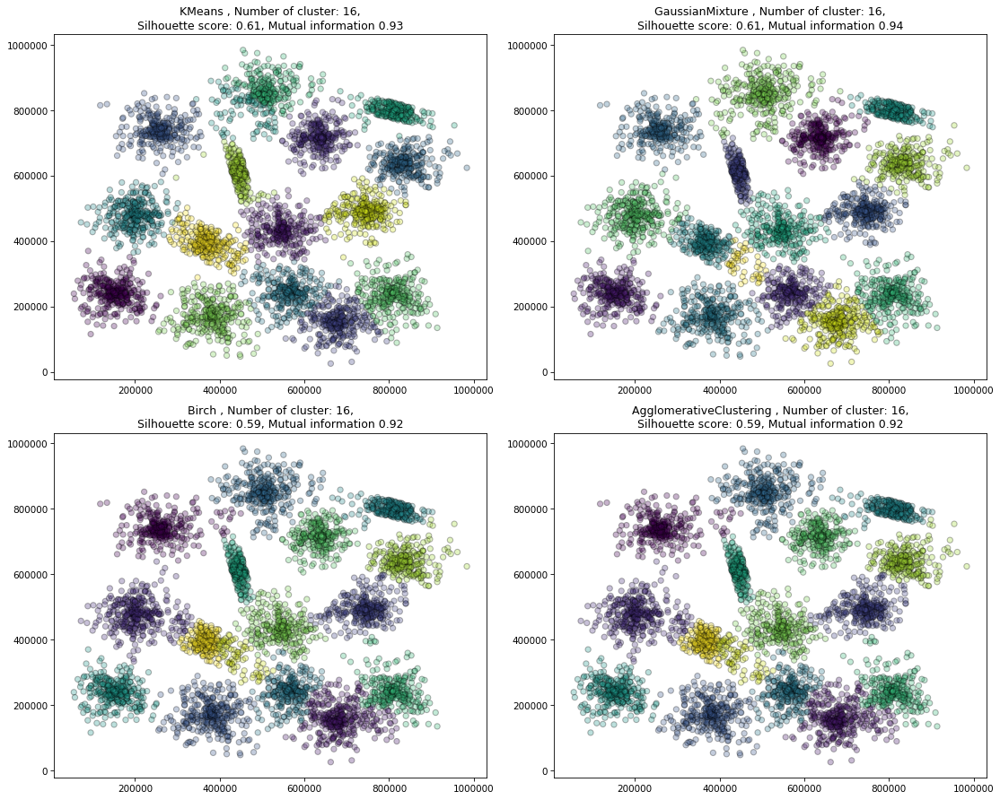

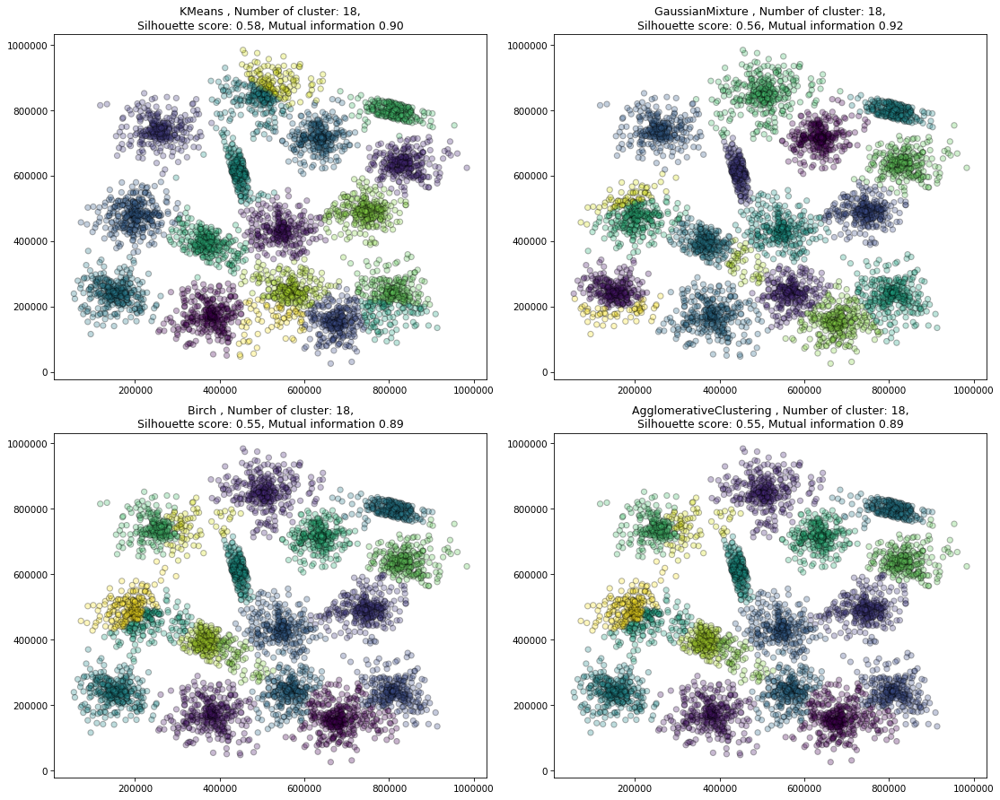

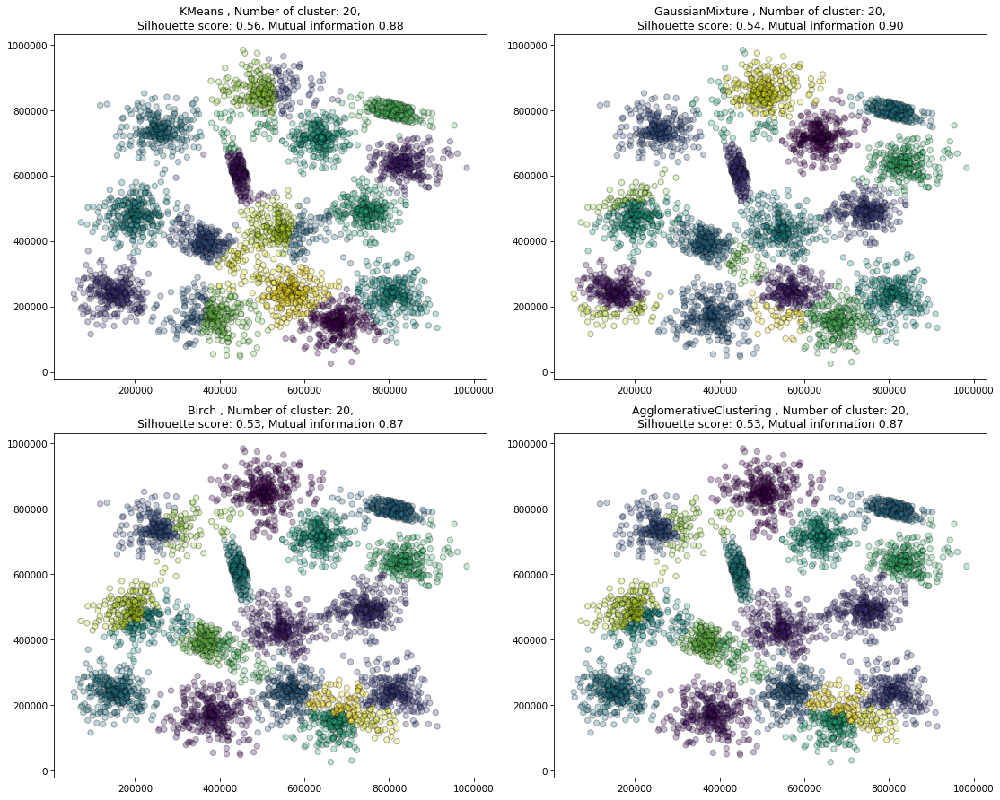

In [8]:
number_of_clusters = np.arange(10, 21, 2, dtype = int)

for number in number_of_clusters:
    
    clst1 = KMeans(n_clusters = number, random_state = random_state)
    clst2 = GaussianMixture(n_components =  number, random_state = random_state)
    clst3 = Birch(n_clusters = int(number))
    clst4 = AgglomerativeClustering(n_clusters = number)
    
    names = ['KMeans', 
             'GaussianMixture', 
             'Birch',
             'AgglomerativeClustering']

    clsts = [clst1, clst2, clst3, clst4]
                                
    fig, axes = plt.subplots(
        ncols=2,
        nrows=2, figsize=(6 * ((len(clsts) + 1)) // 2, 12),
        dpi=75
    )

    for clst, ax, name in zip(clsts, axes.flat, names):
        model = clst.fit_predict(points)
        ax = plt.subplot(ax)
        plt.scatter(points[:,0], points[:,1], c = model, alpha=0.3, edgecolor='k')
        plt.title(" %s , Number of cluster: %d, \n Silhouette score: %0.2f, Mutual information %0.2f " 
                  % (name, number, silhouette_score(points, model), adjusted_mutual_info_score(labels, model)))    
    plt.tight_layout()
    plt.show()
    

### Finding the Number of Clusters with Bootstrap

So, first, based on your observations made at the previous task, choose one algorithm assuming **you do not have true labels and do not know the true number of clusters**.

In [311]:
from scipy import stats
from sklearn.utils import resample
from tqdm import tqdm_notebook

### BEGIN Solution
cluster_ns = np.arange(12, 18, dtype = int)
sample_number = 100

# >>> your code here <<<

bootstraps = []
for i in range(sample_number):
    bootstraps.append(resample(points))

sh_score = []
  
for i_cn, n_clusters in tqdm_notebook(enumerate(cluster_ns)):
    s_score = []
    for sample_index in tqdm_notebook(range(sample_number)):
        model = GaussianMixture(n_components=n_clusters, random_state = random_state).fit(bootstraps[sample_index])
        predicted_clusters = model.predict(bootstraps[sample_index])
        s_score.append(silhouette_score(bootstraps[sample_index], predicted_clusters))
    sh_score.append(s_score)
    
    
print("95% confidence interval", 
      stats.norm.interval(0.95, loc=np.mean(sh_score), scale=np.sqrt(np.var(sh_score))),
      "variance", np.var(sh_score))
### END Solution


95% confidence interval (0.5240928476420151, 0.6384947165014675) variance 0.0008517459257945705


Text(0.5, 1.0, 'Silhouette score')

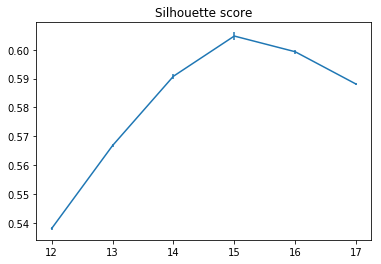

In [313]:
plt.errorbar(cluster_ns, np.mean(sh_score, axis = 1), yerr = 2 * (np.var(sh_score, axis = 1)))
plt.title("Silhouette score")

In [ ]:
# >>> your code here <<<

<br>

# Dimentionality Reduction and Manifold Learning

## Task 2 (1 + 1 + 2 + 1 = 5 pt.)

Assume that you have $n$ points in $D$ dimensional space:

$$u_1, ..., u_n \in \mathbb R^D.$$

There exist a *linear* data transformation $F(u): \mathbb R^D \rightarrow \mathbb R^d, D >> d$ such that:

$$(1-\delta) \|u_i - u_j\|^2 \leq \|F(u_i) - F(u_j)\|^2\leq (1+\delta) \|u_i - u_j\|^2$$

with high probability.

The transformation $F(u)$ is: $F(u) = \tfrac{1}{\sqrt d}Xu$, and $X \in \mathbb R^{d \times D}$ is a random matrix, components of which are independent identically distributed $X_{ij} \sim \mathcal{N}(0, 1)$.

This statement means that there exists a matrix that reduces the original dimensionality such that pairwise distances are not distorted much. This is a theoretical probabilistic result that *guarantees* you such a transformation. We will obtain a bound on $d$ for which this result holds true.

**Chernoff inequality.** This unequality states a bound on distribution tail.

$$\mathbb P(X \geq t) \leq \frac{\mathbb E \exp(\lambda X)}{\exp(\lambda t)}$$

**Definition.** Random variable $X$ is called subexponential with parameters $(\sigma^2, b)$, if for all $\lambda: |\lambda| < \frac{1}{b}$ the following is true:

$$\mathbb E \exp(\lambda (X - \mathbb E X)) \leq \exp\left(\frac{\lambda^2\sigma^2}{2}\right)$$

**Fact.** $\chi^2$ distribution with $d$ degrees of freedom is a sum of squares of $d$ independent standard gaussian random variables.


**Fact.** $\chi^2$ distribution with $d$ degrees of freedom is subexponential with parameters $\sigma^2 = 4d, b = 4$

<br>

### Task 2.1 (1 pt.):

Using the above information, prove that for $Y \sim \chi^2$ with $d$ degrees of freedom the following inequality holds true:

$$\mathbb P (\lvert Y - d \rvert \geq t) \leq 2\exp\left(\frac{-t^2}{8d}\right)$$

for $t \leq \frac{\sigma^2}{b}$. 

**Hint**: you will need to optimise the power of exponential in order to get optimal $\lambda$.

**BEGIN Solution**

As we know, $Y \sim \chi^2$ is $(4d, 4)$-subexponential; taking into account, that $\mathbb EY = d$ the following equation follows right from the definition:
$$\mathbb E \exp(\lambda (Y - d)) \leq \exp\left({2\lambda^2d}\right)$$
for $|\lambda| < \frac{1}{4}$

From the Chernoff:
$$ \mathbb P (Y - d \geq t) \leq \frac{\mathbb E\exp(\lambda_1{}(Y - d))}{\exp(\lambda_1{}t)} $$
<br>
$$ \mathbb P (d - Y \geq t) \leq \frac{\mathbb E\exp(\lambda_2{}(d - Y))}{\exp(\lambda_2{}t)} $$
for positive $\lambda_1$, $\lambda_2$

Applying the first formula of solution, we obtain correspondingly for $\lambda = \lambda_1$ and $\lambda = -\lambda_2$ equal expressions:

$$\begin{cases}
 \mathbb P (Y - d \geq t) \leq \frac{\mathbb E\exp(\lambda_1{}(Y - d))}{\exp(\lambda_1{}t)}\\
 \mathbb P (d - Y \geq t) \leq \frac{\mathbb E\exp(\lambda_2{}(d - Y))}{\exp(\lambda_2{}t)}\end{cases}
\Rightarrow
\begin{cases}
 \mathbb P (Y - d \geq t) \leq \frac{\exp(2\lambda_1^2d)}{\exp(\lambda_1{}t)}\\
 \mathbb P (d - Y \geq t) \leq \frac{\exp(2\lambda_2^2d)}{\exp(\lambda_2{}t)}
 \end{cases}$$
 
Note, that $\lambda < \frac{1}{4}$

$$\Rightarrow \mathbb P (\lvert Y - d \rvert \geq t) \leq 2 \exp\Bigl(2\lambda^2d-\lambda{}t\Bigr)$$
Setting $\lambda = \frac{t}{4d}$ we get: 
$$\mathbb P (\lvert Y - d \rvert \geq t) \leq 2\exp\left(\frac{-t^2}{8d}\right)$$

(note that indeed $|\lambda| < \frac{1}{4}$, since $\Bigl(t\leq\frac{\sigma^2}{b}=\frac{4d}{4}\Bigr) \Rightarrow \Bigl(t\leq{}d \Bigr) \Rightarrow \Bigl(0\leq\lambda=\frac{t}{4d}\leq\frac{d}{4d}=\frac{1}{4}\Bigr)$ and the above results are valid.

**END Solution**

<br>

### Task 2.2 (1 pt.):

Prove that $\frac{\|Xu\|^2}{\|u\|^2}$ is $\chi_2$ random variable with $d$ degrees of freedom.

**BEGIN Solution**

**Theorem**
Let $Z_1, Z_2, \dots, Z_d$ be independent standard normal random variables, where d is a positive integer. Then the random variable

$$\chi (d)^2 = \sum Z_i^2$$

has a $\chi$-square distribution with d degrees of freedom.

$$\frac{||Xu||^2}{||u||^2} = \frac{1}{||u||^2} \sum (X_iu)^2 = \frac{1}{||u||^2} \sum \sum (X_{ij}u_j)^2$$

The squared norm of d standard normally distributed variables is a chi-squared distribution with d degrees of freedom

$$\begin{cases}
\frac{1}{||u||^2} \sim N(0, \frac{1}{||u||^2})\\
X_{ij} \sim N(0,1)
\end{cases}\Rightarrow  \frac{1}{||u||^2} \sum \sum (X_{ij}u_j)^2 \sim N(0, \frac{1}{||u||^2} \sum u_j^2)$$$$
$$

Finally we have:

$$$\frac{||Xu||^2}{||u||^2} = \sum(N(0,1))^2 = \chi^2(d)$$
**END Solution**

<br>

### Task 2.3 (2 pt.)

Having all of the previous results, we now may apply them to get the bound.

From inequality for tails from Task 4.1 we get that:

$$\mathbb P \left(\left\lvert \frac{\|Xu\|^2}{\|u\|^2} - d \right\rvert \geq t\right) \leq 2\exp\left(\frac{-t^2}{8d}\right)$$

This means that probability of such event that our distances will change a lot is bounded.

1. Show that if probability above is small, then probability of: $$(1-\delta) \|u_i - u_j\|^2 \leq \|\frac{1}{\sqrt d} X(u_i - u_j)\|^2\leq (1+\delta) \|u_i - u_j\|^2$$ is big and basically almost equal to $1 - n(n-1)\exp \left(-\frac{\delta^2d}{8}\right)$.

2. After the previous step, we got that if we want to have our inequalities to be true with high probability $1-\varepsilon$, we want to bound it from above. Derive the inequality for $d$ from that.

**Hint:**
* at some point you would like to take $\delta = \frac{t}{d}$. Note that it makes $\delta$ be in range of 0 and 1

**BEGIN Solution**

**1.**
$$\mathbb P \left(\left\lvert \frac{\|Xu\|^2}{\|u\|^2} - d \right\rvert \geq t\right) \leq 2\exp\left(\frac{-t^2}{8d}\right)$$

$$ 
\mathbb P \left(\left\lvert \frac{\|Xu\|^2}{\sqrt{d}} - \|u\|^2 \right\rvert \leq \delta\right) \geq 1 - 2\exp\left(-\frac{\delta^2d}{8}\right)
$$

Taking into account the independence of $X_{ij}, u_i$, we conclude, that the above expression should be multiplied for each of $\frac{n(n-1)}{2}$ pairs $(u_i, u_j)$ to claim $\left\lvert\frac{\|X(u_i - u_j)\|^2}{\sqrt{d}} - \|(u_i - u_j)\|^2 \right\rvert \leq \delta$ for any $(u_i, u_j)$:

$$ 
\mathbb P \left(\left\lvert \frac{\|X(u_i-u_j)\|^2}{\sqrt{d}} - \|(u_i-u_j)\|^2 \right\rvert \leq \delta\right) \geq \Bigl(1 - 2\exp\left(-\frac{\delta^2d}{8}\right)\Bigr)^{\frac{n(n-1)}{2}}
$$

The RHS is roughly equal to $1 - n(n-1)\exp \left(-\frac{\delta^2d}{8}\right)$, which can be obtained from Taylor series expansion: $(1 + \alpha)^n = 1 + \alpha{}n + o(n)$
From the last inequalty, it clearly follows the desired expression:

$$(1-\delta) \|u_i - u_j\|^2 \leq \|\frac{1}{\sqrt d} X(u_i - u_j)\|^2\leq (1+\delta) \|u_i - u_j\|^2$$ 
with $\mathbb P = \Bigl(1 - 2\exp\left(-\frac{\delta^2d}{8}\right)\Bigr)^{\frac{n(n-1)}{2}}$

**2.**


$$1-\varepsilon \leq 1 - n(n-1)\exp \left(-\frac{\delta^2d}{8}\right).$$

$$\varepsilon \geq n(n-1)\exp \left(-\frac{\delta^2d}{8}\right).$$

$$\log\left(\frac{\varepsilon}{n(n-1)}\right) \geq -\frac{\delta^2d}{8}.$$

$$\frac{\delta^2d}{8} \geq \log\left(\frac{n(n-1)}{\varepsilon}\right).$$

$$d \geq \frac{8}{\delta^2}\log\left(\frac{n(n-1)}{\varepsilon}\right)$$

**END Solution**

### Task 2.4 (1 pt.)

We have sucessfully got our lower bound on the dimensionality we can safely reduce to such that pairwise distances do not change much: 

$$d \geq \frac{8}{\delta^2}\log\left(\frac{n(n-1)}{\varepsilon}\right)$$

Note the beauty of that inequality. It **doesn't depend** on original dimensionality $D$, parameters $n$ -- number of samples and $\varepsilon$ -- probability are under the $\log$ function.

This bound is not very tight, using more advanced techniques you may improve it. That means, our estimate of $d$ may be too high, but we can guarantee our result for it. Also remember that this approach is probabilistic, and, basically, depends on how lucky you will be with your data. It is very useful in case of extremely large dimensionalities $D$, and allows to reduce dimensionality while preserving the structure of data.

Now implement the obtained result and confirm that it holds true:

1. Fetch *20news* dataset
2. Check the dimensionality of data
3. Generate a random matrix of the corresponding size. **Note** that this might take a while (or you may run out of memory).
4. Fix $\delta$ = 0.15 and $\varepsilon$ = 0.01
5. Show that distances of transformed data are within the delta tube. Write down 1-2 sentences to point out the ratio. Remember that our result is not applicable in case if distance is 0
6. Show that for smaller $d$ this result doesn't work. You will have to take much smaller $d$ in order to show that (ten times less, for example). Write down 1-2 sentences, describing the result .

In [283]:
from sklearn.datasets import fetch_20newsgroups_vectorized
from sklearn.metrics.pairwise import euclidean_distances
from numpy.random import standard_normal

X = fetch_20newsgroups_vectorized()

In [284]:
X = fetch_20newsgroups_vectorized()
X = X.data[:500].astype(np.float32).toarray()
X.shape

(500, 130107)

In [285]:
### BEGIN Solution

n, D = X.shape
print('D =', D)
print('n =', n)

delta = 0.15
eps = 0.01
d = int(8 / delta**2 * np.log(n * (n - 1) / eps))
print('d =', d)

a = np.random.normal(size=(d,D)).astype(np.float32)
print(a.shape)
new_X = X.dot(a.T) / np.sqrt(d)


D = 130107
n = 500
d = 6055
(6055, 130107)


As we see, dimmensionality is dramatically reduced. Let's check if all the $(u_i - u_j)$ are within $\delta$-tube. The following function counts amount of mistakes.

In [288]:
from itertools import combinations

def count_mistakes(X, new_X, delta=0.15):
    diffs = []
    mistakes = 0
    for i,j in combinations(list(range(500)), 2):
        old_dist = np.linalg.norm(X[i] - X[j])
        new_dist = np.linalg.norm(new_X[i] - new_X[j])
        if old_dist > 0.00000001:
            # actually != 0, but just in case
            diffs.append(new_dist - old_dist)
            if diffs[-1] > delta:
                mistakes += 1
    return mistakes

print("Number of mistakes", count_mistakes(X, new_X, delta))

Number of mistakes 0


Now we reduce d even smaller

In [289]:
wrong_d = int(8 / delta**2 * np.log(n * (n - 1) / eps)) // 30
print('Optimistic d =', wrong_d)

wrong_a = np.random.normal(size=(wrong_d,D)).astype(np.float32)
new_X_wrong_d = X.dot(wrong_a.T) / np.sqrt(wrong_d)

print("Number of mistakes", count_mistakes(X, new_X_wrong_d, delta))
### END Solution

Optimistic d = 201
Number of mistakes 916


## Task 3 (2 + 3 = 6 pt.). MNIST principal component analysis 

### Task 3.1 (2 pt.)

Download `MNIST` dataset. Here we will estimate the data intrinsic dimensionality, decompose the dataset into principal components and estimate the cumulative explained variance by each component.

You can either use the method proposed here https://www.stat.berkeley.edu/~bickel/mldim.pdf for the sample intrinsic dimension estimation, or any other method known to you. For the first case, you can use implemented code from here https://gist.github.com/mehdidc/8a0bb21a31c43b0cbbdd31d75929b5e4 

1. Estimate the intrinsic dimensionality of the dataset. Provide the plot.
2. Decompose the data into principal components (PCA). Plot the cumulative explained variance by each component.
3. Plot the example of reconstructed image with **6** different sets of components and prove the corresponding explained variance. You can choose any digit from the dataset.

In [249]:
from sklearn import datasets
import matplotlib.pyplot as plt


digits = datasets.load_digits()

from sklearn.preprocessing import StandardScaler
data = StandardScaler().fit_transform(digits.data)


### BEGIN Solution


In [12]:
from tqdm import tqdm
import pandas as pd
import numpy as np
from sklearn.neighbors import NearestNeighbors

def intrinsic_dim_sample_wise(X, k=5):
    neighb = NearestNeighbors(n_neighbors=k + 1).fit(X)
    dist, ind = neighb.kneighbors(X)
    dist = dist[:, 1:]
    dist = dist[:, 0:k]
    assert dist.shape == (X.shape[0], k)
    assert np.all(dist > 0)
    d = np.log(dist[:, k - 1: k] / dist[:, 0:k-1])
    d = d.sum(axis=1) / (k - 2)
    d = 1. / d
    intdim_sample = d
    return intdim_sample

def intrinsic_dim_scale_interval(X, k1, k2):
    X = pd.DataFrame(X).drop_duplicates().values # remove duplicates in case you use bootstrapping
    intdim_k = []
    for k in range(k1, k2 + 1):
        m = intrinsic_dim_sample_wise(X, k).mean()
        intdim_k.append(m)
    return intdim_k

def repeated(func, X, nb_iter=100, random_state=None, verbose=0, mode='bootstrap', **func_kw):
    if random_state is None:
        rng = np.random
    else:
        rng = np.random.RandomState(random_state)
    nb_examples = X.shape[0]
    results = []

    iters = range(nb_iter)
    if verbose > 0:
        iters = tqdm(iters)    
    for i in iters:
        if mode == 'bootstrap':
            Xr = X[rng.randint(0, nb_examples, size=nb_examples)]
        elif mode == 'shuffle':
            ind = np.arange(nb_examples)
            rng.shuffle(ind)
            Xr = X[ind]
        elif mode == 'same':
            Xr = X
        else:
            raise ValueError('unknown mode : {}'.format(mode))
        results.append(func(Xr, **func_kw))
    return results

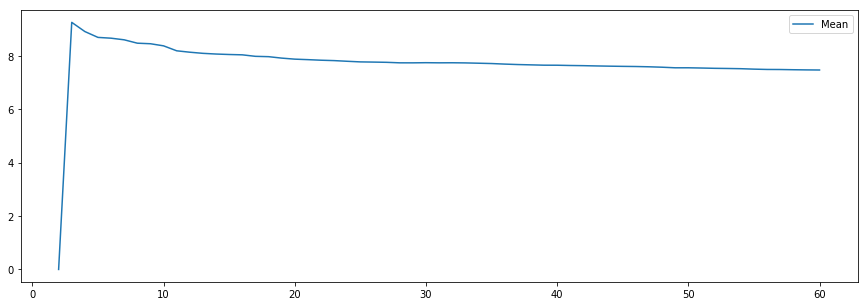

In [185]:
plt.figure(figsize=(15, 5))
plt.plot(np.arange(len(intrinsic_dim_scale_interval(data, k1=0, k2=60))), intrinsic_dim_scale_interval(data, k1=0, k2=60), label = 'Mean')

plt.legend()


100%|██████████| 50/50 [01:05<00:00,  1.35s/it]

(array([ 1.,  3.,  2.,  7.,  9.,  6., 11.,  1.,  4.,  6.]),
 array([7.55084315, 7.60121288, 7.65158261, 7.70195234, 7.75232207,
        7.8026918 , 7.85306153, 7.90343126, 7.95380099, 8.00417072,
        8.05454045]),
 <a list of 10 Patch objects>)

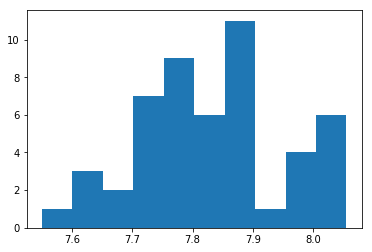

In [6]:
k1 = 10 # start of interval(included)
k2 = 20 # end of interval(included)
intdim_k_repeated = repeated(intrinsic_dim_scale_interval, 
                             data, 
                             mode='bootstrap', 
                             nb_iter=50, # nb_iter for bootstrapping
                             verbose=1, 
                             k1=k1, k2=k2)
intdim_k_repeated = np.array(intdim_k_repeated)
# the shape of intdim_k_repeated is (nb_iter, size_of_interval) where 
# nb_iter is number of bootstrap iterations (here 500) and size_of_interval
# is (k2 - k1 + 1).
# Plotting the histogram of intrinsic dimensionality estimations repeated over
# nb_iter experiments
plt.hist(intdim_k_repeated.mean(axis=1))

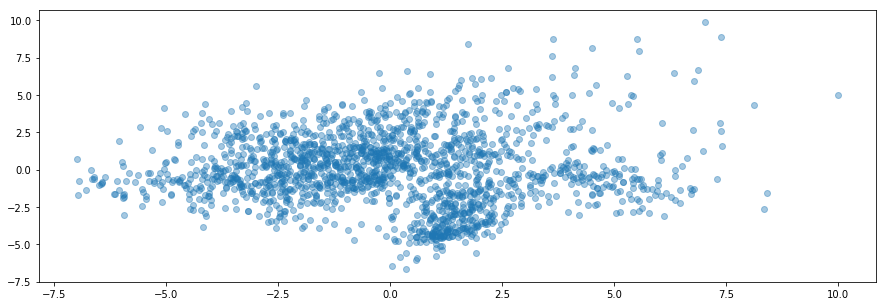

In [46]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
projected_data = pca.fit_transform(data)
plt.figure(figsize=(15, 5))
plt.plot(projected_data[:,0], projected_data[:,1], 'o', alpha=0.4)

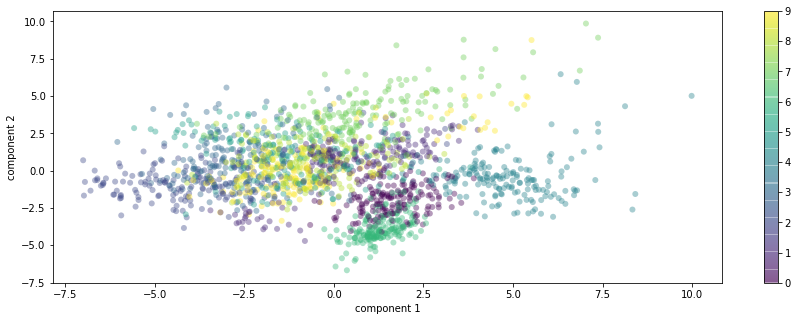

In [47]:
plt.figure(figsize=(15, 5))

plt.scatter(projected_data[:, 0], projected_data[:, 1],
            c=digits.target, edgecolor='none', alpha=0.4)

plt.xlabel('component 1')
plt.ylabel('component 2')
plt.colorbar();

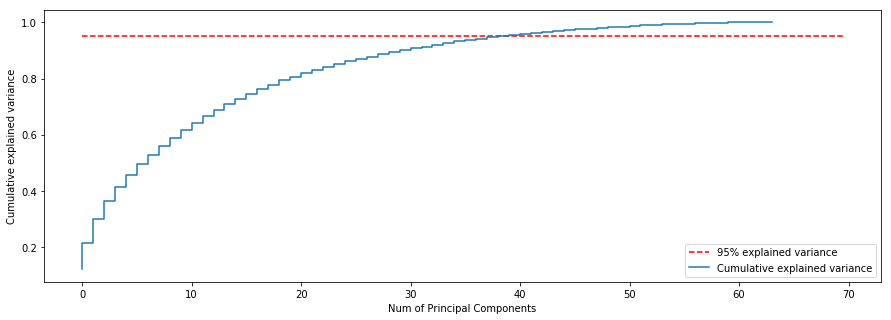

In [282]:
pca = PCA().fit(data)
plt.figure(figsize=(15, 5))
plt.plot(np.arange(0, 70, 0.5), [0.95]*len(np.arange(0, 70, 0.5)), linestyle = '--', color = 'red', 
         label = '95% explained variance')
plt.step(np.arange(0, 64, 1, dtype = int), np.cumsum(pca.explained_variance_ratio_), label = 'Cumulative explained variance')
plt.xlabel('Num of Principal Components')
plt.ylabel('Cumulative explained variance')
plt.legend()

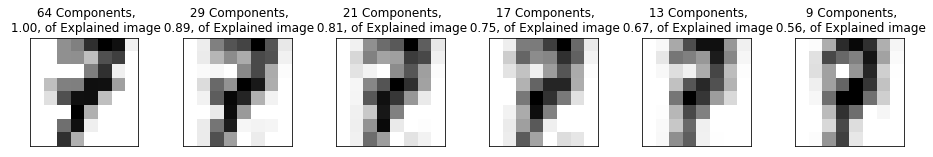

In [184]:
fig, axes = plt.subplots(1, 6, figsize=(16, 2),
                         subplot_kw={'xticks':[], 'yticks':[]},
                         gridspec_kw=dict(hspace=0.1, wspace=0.2))

n_conponents = [64, 29, 21, 17, 13, 9]

k = dict(zip(np.arange(0, 64, 1), np.cumsum(pca.explained_variance_ratio_)))

for i, ax in zip(n_conponents, axes.flat):
    pca = PCA(n_components= i)
    X_reduce = pca.fit_transform(digits.data)
    X_recovered = pca.inverse_transform(X_reduce)
    
    ax.set_title(' %d Components,\n %0.2f, of Explained image' % (i, k[i-1]))
    ax.imshow(X_recovered[7].reshape(8, 8),
                  cmap='binary', interpolation='nearest',
                  clim=(0, 16))
    

In [ ]:
### END Solution
plot_images(# >>> your code here <<<)

<br>

### Task 3.2 (3 pt.)

Here we will visualize the decomposition, to observe how the data diverges across different manifold learning methods. We are to compare `PCA`, `ICA` and `Isomap` non-linear decompositions [see more over here https://scikit-learn.org/stable/modules/manifold.html], and check the classification accuracies on the new features. 

1. **(1 pt.)** Visualise ICA, PCA and Isomap 3D decomposition on 3 components in `plotly`. Be sure that the data is whitened (scaled). 
2. **(1 pt.)** Calculate new features of the data with ICA, PCA, and Isomap. **Choose the number of components according to your estimation of intrinsic dimention, see Task 3.1**. Calculate the classification accuracy on these features with `LogisticRegression` on cv=5, 3 repeats. Use `RepeatedKFold` and fix the `random_seed=0`.
3. **(1 pt.)** Show that `Isomap` gives statistically significant improvement on the classification accuracy with any appropriate statistical test (for example `scipy.stats.ttest_ind`). Provide corresponding `p-values`. Justify your results, write down 2-3 sentences.

In [256]:
from plotly.offline import download_plotlyjs, init_notebook_mode, plot,iplot
import plotly.graph_objs as go
import colorlover as cl
import pandas as pd
import sklearn.manifold 
from plotly import tools

from sklearn.manifold import Isomap

init_notebook_mode(connected=True)

iso = Isomap(n_neighbors=5, n_components=3, eigen_solver='dense')

### BEGIN Solution

digits = datasets.load_digits()

from sklearn.preprocessing import StandardScaler
data = StandardScaler().fit_transform(digits.data)

### END Solution

In [261]:
def plot_3D(X_3D, title):
    x, y, z = X_3D[:,0], X_3D[:,1], X_3D[:,2]

    points = go.Scatter3d(
        x=x,
        y=y,
        z=z,
        mode='markers',
        marker=dict(color=digits.target, colorscale='Viridis', size=10),
        text=digits.target.tolist(),
        textposition='bottom right'
    )

    data=go.Data([points])
    layout=go.Layout(title=title)
    figure=go.Figure(data=data,layout=layout)
    iplot(figure, filename='pyguide_1', show_link = False)

In [262]:
pca = PCA(n_components=3)
X_3D = pca.fit_transform(data)
plot_3D(X_3D, 'PCA')

/Users/renatarenata/anaconda3/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:39: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




In [259]:
from sklearn.decomposition import FastICA

ica = FastICA(n_components=3)
X_3D = ica.fit_transform(data)
plot_3D(X_3D, 'ICA')

/Users/renatarenata/anaconda3/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:39: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




In [260]:
iso = Isomap(n_neighbors=5, n_components=3, eigen_solver='dense')
X_3D = iso.fit_transform(data)
plot_3D(X_3D, 'ISOMAP')

/Users/renatarenata/anaconda3/lib/python3.6/site-packages/plotly/graph_objs/_deprecations.py:39: DeprecationWarning:

plotly.graph_objs.Data is deprecated.
Please replace it with a list or tuple of instances of the following types
  - plotly.graph_objs.Scatter
  - plotly.graph_objs.Bar
  - plotly.graph_objs.Area
  - plotly.graph_objs.Histogram
  - etc.




In [ ]:
from sklearn.model_selection import RepeatedKFold
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(solver='lbfgs', multi_class='multinomial')
rkf = RepeatedKFold(n_splits=5, n_repeats=3, random_state=0)

scores=list()

### BEGIN Solution

print(temp)
### END Solution

In [ ]:
# >>> your code here <<<

In [ ]:
# >>> your code here <<<

<br>

### Task 3.3* (4 pt.). Bonus.

Explore `KMNIST` dataset https://github.com/rois-codh/kmnist (Kuzushiji-MNIST (10 classes, 28x28, 70k examples)). You are to engineer new features with any convenient method of Manifold Learning to increase the classification accuracy. Use the $k$NN classifier and validation code from here https://github.com/rois-codh/kmnist/blob/master/benchmarks/kuzushiji_mnist_knn.py. Your accuracy on the test should be more than `91.56%`.

**NOTE** that the data is rather heavy, thus your decomposition will take a while.